### Задача
У цьому ДЗ ми попрактикуємось моделювати часові ряди на даних з [Store Item Demand Forecasting Challenge](https://www.kaggle.com/competitions/demand-forecasting-kernels-only/overview). Ми будемо працювати лише з тренувальними даними цього змагання і задача у нас буде дещо змінена. Фокус буде на пошуці найкращої моделі, експериментах і використанні функціоналу `darts`.

Якщо якісно попрацювати в цьому завданні - це буде чудовий приклад проєкту для вашого портфоліо: "спрогнозував(-ла) поденні продажі на 1 міс для 50 товарів в 10 магазинах" звучить вражаюче! Але ми в рамках ДЗ для оптимізації часу сконцентруємось на моделюванні продажів одного товару в одному магазині.

**Задача**

Вам надано дані про продажі товарів у магазинах за 5 років. Хочемо навчитись передачати продажі в наступному місяці поденно кожного з 50 товарів у кожному з 10 магазинів. Відповідно будемо проводити експерименти, аби знайти найкращу модель для цього.

На відміну від змагання, ми будемо використовувати метрику МАРЕ (Mean Absolute Percentage Error) замість SMAPE (Symmetric Mean Absolute Percentage Error). Проте, ви також можете розрахувати SMAPE і подати свої результати через late submission на Kaggle.

1. Завантажуємо дані в Pandas.

  1. Завантажте дані з файлу `train.csv.zip` за допомогою бібліотеки Pandas.
  2. Перетворіть колонку `date` на формат `datetime`.
  3. Встановіть колонку `date` як індекс для датафрейму.
  4. Виведіть перші 10 рядків отриманого датафрейму та інформацію про датафрейм.

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from darts.models import XGBModel
from darts.dataprocessing.transformers import Scaler
import holidays
from darts import TimeSeries

In [32]:
data = pd.read_csv('train.csv')
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)
display(data.head(10))

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10
2013-01-06,1,1,12
2013-01-07,1,1,10
2013-01-08,1,1,9
2013-01-09,1,1,12


In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 913000 entries, 2013-01-01 to 2017-12-31
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   store   913000 non-null  int64
 1   item    913000 non-null  int64
 2   sales   913000 non-null  int64
dtypes: int64(3)
memory usage: 27.9 MB


### Functions

In [37]:
def eval_forecast(model, val, forecast):
    mape_ = mape(val, forecast)
    print(f"model {model} obtains MAPE: {mape_:.2f}%")
    return mape_

In [39]:
def enrich_with_date_features(ts: TimeSeries) -> TimeSeries:
    df = ts.to_dataframe().copy()
    df["dayofweek"] = df.index.dayofweek
    df["quarter"] = df.index.quarter
    df["month"] = df.index.month
    df["year"] = df.index.year
    df["dayofyear"] = df.index.dayofyear
    df["dayofmonth"] = df.index.day
    df["is_month_start"] = df.index.is_month_start.astype(int)
    df["is_month_end"] = df.index.is_month_end.astype(int)
    df["is_quarter_start"] = df.index.is_quarter_start.astype(int)
    df["is_year_end"] = df.index.is_year_end.astype(int)
    df["is_weekend"] = (df.index.dayofweek >= 5).astype(int)
    us_holidays = holidays.US()
    df["is_holiday"] = df.index.isin(us_holidays).astype(int)
    df["sin_day"] = np.sin(2 * np.pi * df["dayofyear"] / 365)
    df["cos_day"] = np.cos(2 * np.pi * df["dayofyear"] / 365)
    df["sin_month"] = np.sin(2 * np.pi * df["month"] / 12)
    df["cos_month"] = np.cos(2 * np.pi * df["month"] / 12)
    df["sin_week"] = np.sin(2 * np.pi * df["dayofweek"] / 7)
    df["cos_week"] = np.cos(2 * np.pi * df["dayofweek"] / 7)
    df["is_nov_30"] = ( (df.index.month == 11) & (df.index.day == 30) ).astype(int)
    df["is_saturday"] = (df.index.dayofweek == 5).astype(int)
    if ts.columns[0] in df.columns:
        df = df.drop(columns=ts.columns[0])
    return TimeSeries.from_dataframe(df)

In [41]:
def plot_results(train, validation, forecast):
    """
    Приймає три часові ряди: train, validation, forecast (прогноз моделі).
    Будує два графіки:
    1. Загальний графік – відображає весь навчальний ряд, валідаційний ряд і прогноз.
    2. Наближений графік – фокусується на останніх даних навчального ряду та всього валідаційного ряду для кращої візуалізації точності прогнозу.
    """
    # Загальний графік
    f, ax = plt.subplots(1, 1, figsize=(15, 6))
    sns.lineplot(x=train.time_index, y=train.values().flatten(),
                 ax=ax, color='gray', label='Train')
    sns.lineplot(x=validation.time_index, y=validation.values().flatten(),
                 ax=ax, color='green', label='Validation')
    sns.lineplot(x=forecast.time_index, y=forecast.values().flatten(),
                 ax=ax, color='blue', label='Prediction')
    ax.set_title('Прогноз моделі', fontsize=16)
    ax.set_xlabel('Date', fontsize=14)
    ax.set_ylabel('Sales', fontsize=14)
    ax.legend()
    plt.show()

    # Наближений графік
    n = len(validation)
    hist_segment = train[-n:] 

    combined = hist_segment.concatenate(validation)

    f, ax = plt.subplots(1, 1, figsize=(15, 6))
    sns.lineplot(x=train[-n:].time_index, y=train[-n:].values().flatten(),
                 ax=ax, color='gray', label='Train')
    sns.lineplot(x=validation.time_index, y=validation.values().flatten(),
                 ax=ax, color='green', label='Validation')
    sns.lineplot(x=forecast.time_index, y=forecast.values().flatten(),
                 ax=ax, color='blue', label='Prediction')
    ax.set_title('Прогноз моделі', fontsize=16)
    ax.set_xlabel('Date', fontsize=14)
    ax.set_ylabel('Sales', fontsize=14)
    ax.legend()
    plt.show()
  

In [43]:
def fit_and_plot(model, series, train, val):
  model.fit(train)
  forecast = model.predict(len(val))
  plot_results(series1, series2, forecast)
  eval_forecast(model, val, forecast)

### Data preprocess
2. Давайте трошки зрозуміємо дані. У нас 10 магазинів і 50 айтемів в кожному. Хочемо зрозуміти, чи відрізняється динаміка по кожному айтему в магазинах. Як би ви це візуалізували? Побудуйте 3 графіка, які вам допоможуть. Можна використати будь-який інструмент: matplotlib, seaborn, plotly.

  Напишіть висновок з побудованих вами візуалізацій.
  
    **Підказка**: я б спробувала вивести середнє значення і довірчий інтервал (який включає весь діапазон значень з різних магазинів) для динаміки кожного айтема, або принаймні для декількох айтемів, аби зрозуміти тенденцію.



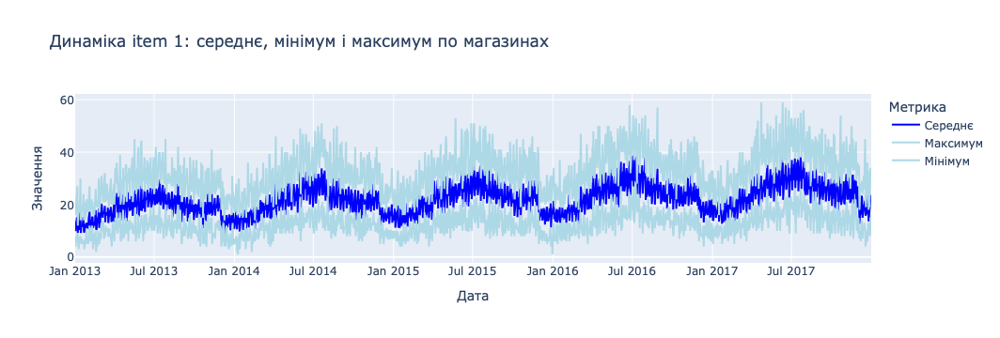

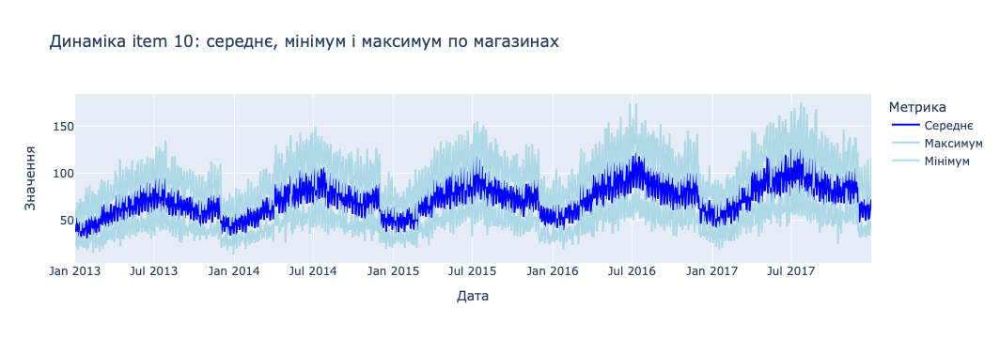

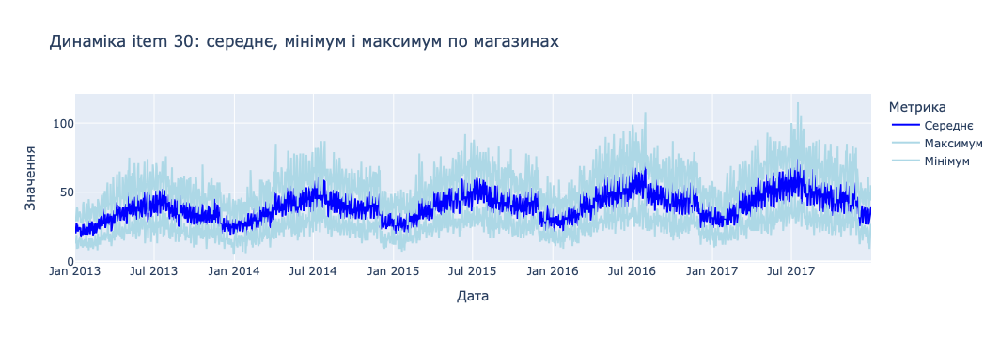

In [45]:
for i in [1,10,30]:
    # Фільтруємо по айтему i
    item_i = data[data['item'] == i]
    
    # Обчислюємо агрегації по датах
    agg = item_i.groupby('date')['sales'].agg(['mean', 'min', 'max']).reset_index()
    
    # Створюємо графік
    fig = go.Figure()
    
    # Середнє значення
    fig.add_trace(go.Scatter(
        x=agg['date'], y=agg['mean'],
        name='Середнє',
        line=dict(color='blue')
    ))
    
    # Максимум
    fig.add_trace(go.Scatter(
        x=agg['date'], y=agg['max'],
        name='Максимум',
        line=dict(color='lightblue'),
        showlegend=True
    ))
    
    # Мінімум
    fig.add_trace(go.Scatter(
        x=agg['date'], y=agg['min'],
        name='Мінімум',
        line=dict(color='lightblue'),
        showlegend=True
    ))
    
    fig.update_layout(
        title=f"Динаміка item {i}: середнє, мінімум і максимум по магазинах",
        xaxis_title="Дата",
        yaxis_title="Значення",
        legend_title="Метрика",
        hovermode="x unified"
    )
    
    fig.show()

Загалом видно тренд на збiльшення продажiв з часом, явно видно сезоннiсть, також видно рiзкий спад продажiв по всим магазинам 1 грудня - певно пiсля чорної пʼятниці.


3. Для початку проаналізуємо лише один ряд, а далі зможемо зациклити тренування моделей.
  
  Виберіть підмножину даних, що відповідає продажам товару з `item == 1` у магазині з `store == 1`.

  Зробіть декомпозицію цього рядку за адитивною моделлю на тренд, сезонність і залишки з бібліотекою `statsmodels`.

  Зробіть висновки з отриманих візуалізацій. Чи щось би могло вам допомогти ліпше зрозуміти ці візуалізації? (з точки зору обробки даних)

In [57]:
data_1_1 = data[(data['item'] == 1) & (data['store'] == 1)]

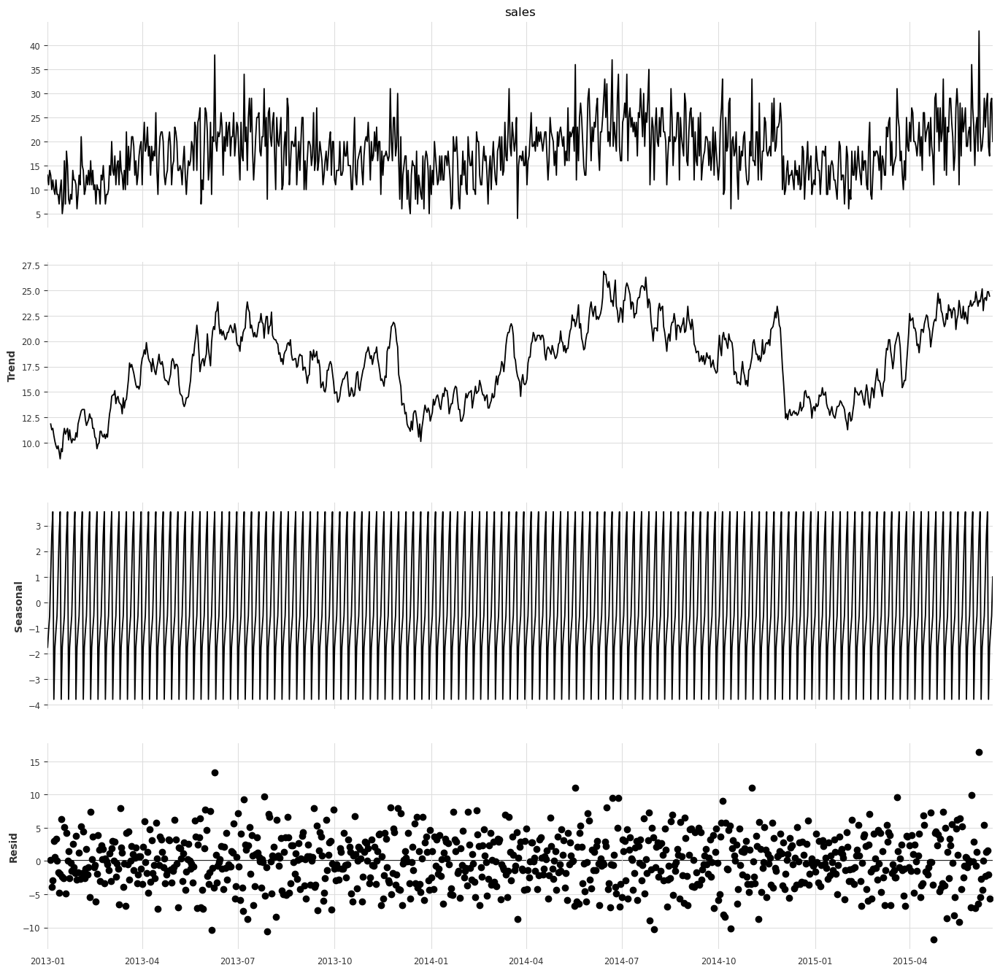

In [59]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Візуалізація адитивної декомпозиції для часового ряду
decomposition_plot = seasonal_decompose(data_1_1['sales'][:900],
                                              model='additive')
fig = decomposition_plot.plot()  
fig.set_size_inches(15, 15)   
plt.show()

Тренд хвилеподiбний, це означає що дані циклічні, залишки розташовані навколо 0 та паттерн візуально відсутній.


4. Зі створеної підможени даних в попередньому пункті створіть обʼєкт класу `TimeSeries` в `darts` лише для колонки `sales`.

In [61]:
from darts import TimeSeries

# Завантаження даних в darts
series = TimeSeries.from_dataframe(data_1_1, value_cols='sales')

In [63]:
series

<TimeSeries (date: 1826, component: 1, sample: 1)>
array([[[13.]],

       [[11.]],

       [[14.]],

       ...,

       [[15.]],

       [[27.]],

       [[23.]]])
Coordinates:
  * date       (date) datetime64[ns] 2013-01-01 2013-01-02 ... 2017-12-31
  * component  (component) object 'sales'
Dimensions without coordinates: sample
Attributes:
    static_covariates:  None
    hierarchy:          None
    metadata:           None

5. Використовуючи метод `series.split_before` розбийте дані на тренування і валідацію так, аби валідація починалась з `2017-10-01` включно.

  Візуалізуйте на одному графіку тренувальну і валідаційну частину як було показано в лекції.

<Axes: xlabel='date'>

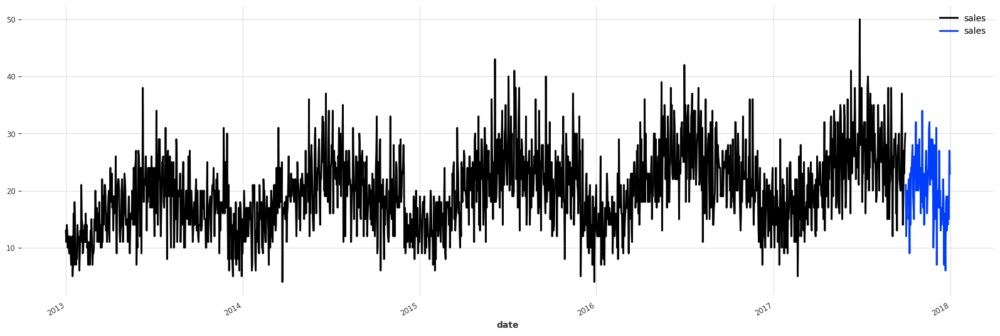

In [65]:
series1, series2 = series.split_before(pd.Timestamp('2017-10-01'))
plt.figure(figsize=(20,6))
series1.plot()
series2.plot()

### ACF, PACF
6. Побудуйте часткову автокореляційну фукнцію для цього нашого ряду в `series`. Напишіть висновки - які лаги є важливими для прогнозування?

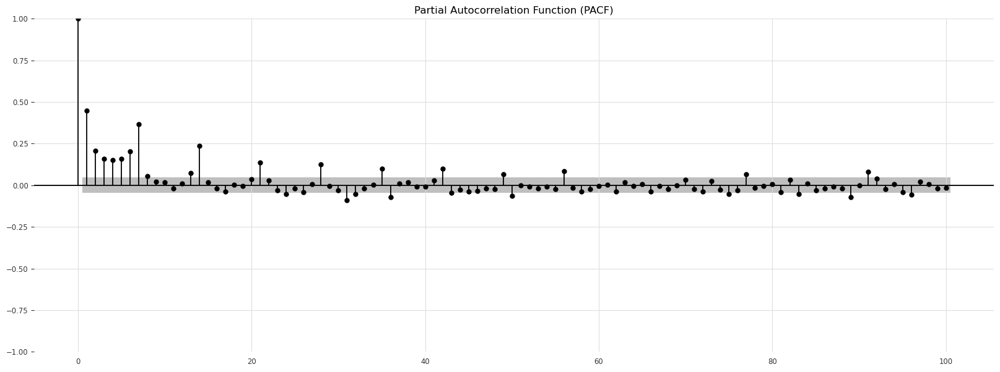

In [67]:
from statsmodels.graphics.tsaplots import plot_pacf

# Візуалізація часткової автокореляційної функції (PACF)
fig, ax = plt.subplots(figsize=(20, 7))
plot_pacf(data_1_1['sales'], lags=100, method='ywm', ax=ax)
ax.set_title('Partial Autocorrelation Function (PACF)')
plt.show()

Кореляція на лагах 1 - 8 i далі на кожному 7му лагу є значущою, також на 31му. 

7. Виявіть сезональність тренувального ряду використовуючи фукнкцію `check_seasonality` з `darts`.

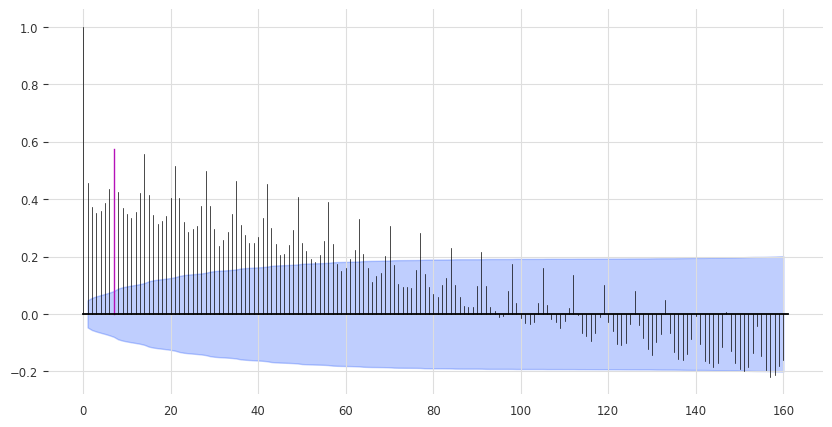

In [69]:
from darts.utils.statistics import plot_acf, check_seasonality

plot_acf(series1, m=7, alpha=0.05, max_lag=160)

In [73]:
for m in range(2, 32):
    is_seasonal, period = check_seasonality(series1, m=m, alpha=0.05, max_lag=365)
    if is_seasonal:
        print("There is seasonality of order {}.".format(period))

There is seasonality of order 7.
There is seasonality of order 14.
There is seasonality of order 21.
There is seasonality of order 28.


### NaiveSeasonal + NaiveDrift
8. Побудуйте наївну модель NaiveSeasonal + NaieDrift для прогнозування даних. Кількість кроків для прогнозування визначіть зі свого аналізу в попередніх пунктах. Візуалізайте передбачення проти справжніх даних так, аби було видно якість передбачень. Зробіть висновок про модель. Вона точна?

  Якщо у вас є ідеї, як поліпшити якість передбачення саме наївними моделями - реалізуйте їх в цьому пункті :)

<Axes: xlabel='date'>

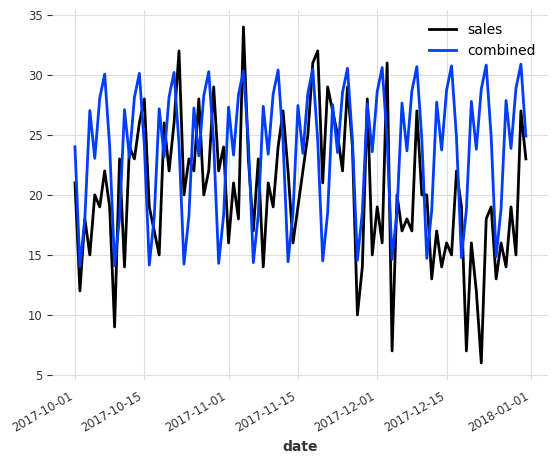

In [75]:
from darts.models import NaiveDrift, NaiveSeasonal

seasonal_model = NaiveSeasonal(K=7)
seasonal_model.fit(series1)
seasonal_forecast = seasonal_model.predict(len(series2))

drift_model = NaiveDrift()
drift_model.fit(series1)
drift_forecast = drift_model.predict(len(series2))

combined_forecast = drift_forecast + seasonal_forecast - series1.last_value()

series[-92:].plot()
combined_forecast.plot(label="combined")

<Axes: xlabel='date'>

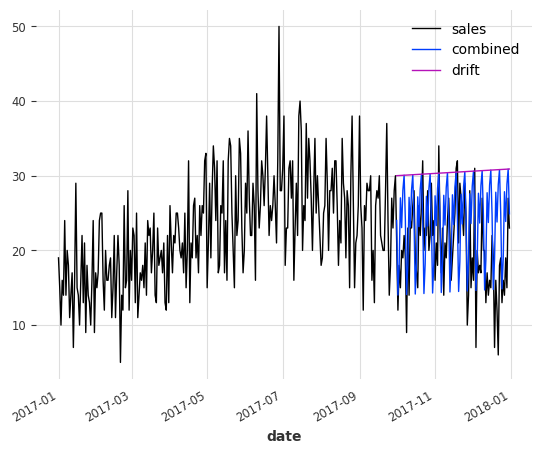

In [77]:
series[-365:].plot(lw=1)
combined_forecast.plot(label="combined",lw=1)
drift_forecast.plot(label="drift",lw=1)

З другого графіку видно що модель NaiveDrift взагалі "мимо", та реальні дані з прогнозованими дуже розходяться особливо наприкінці, коли реальний тренд йде до низу. Спробую урахувати річні коливання, використавши замість NaiveDrift  NaiveSeasonal з К=365 та порахувавши середнє між двома прогнозами:

<Axes: xlabel='date'>

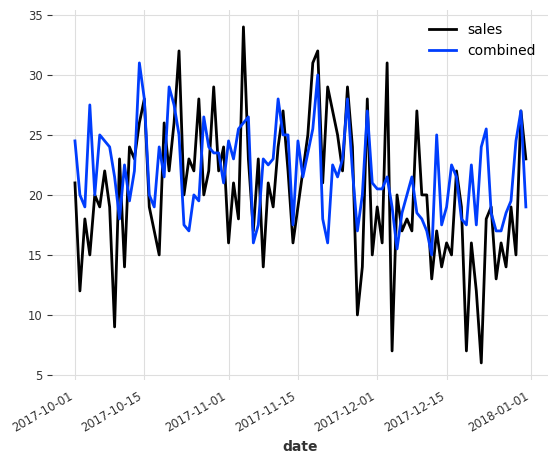

In [79]:
seasonal_model_365 = NaiveSeasonal(K=365)
seasonal_model_365.fit(series1)
seasonal_forecast_365 = seasonal_model_365.predict(92)

combined_seasonal_forecast = (seasonal_forecast_365 + seasonal_forecast) / 2

series[-92:].plot()
combined_seasonal_forecast.plot(label="combined")

З графіку plotly видно що така комбінація наївних моделей краще враховує тренд:

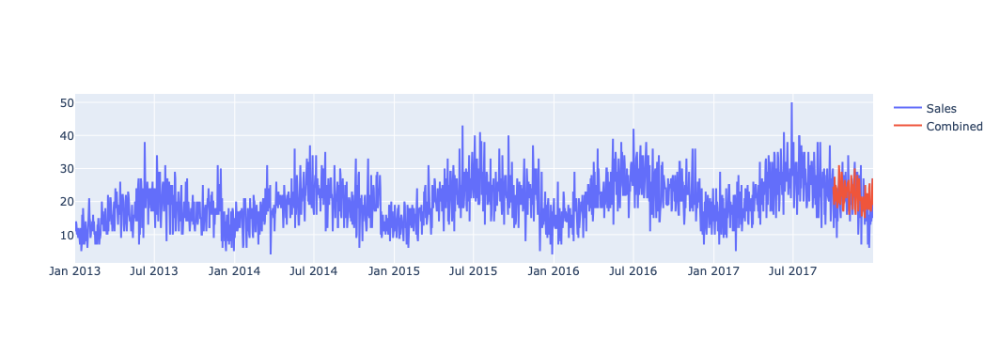

In [82]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=series.time_index, 
    y=series.values().squeeze(),  
    mode='lines', 
    name='Sales'
))
fig.add_trace(go.Scatter(
    x=series2.time_index, 
    y=combined_seasonal_forecast.values().squeeze(),  
    mode='lines', 
    name='Combined'
))
fig.show()

9. Обчисліть помилку прогнозу на валідації наївною моделлю з mape. Далі для всіх моделей необхідно обчислювати помилку прогнозу на валідації.

In [84]:
from darts.metrics import mape

print(
    f"Mean absolute percentage error for the combined naive drift + seasonal: {mape(series2, combined_forecast):.2f}%."
)

print(
    f"Mean absolute percentage error for the combined seasonal(K=7) + seasonal(K=365): {mape(series2, combined_seasonal_forecast):.2f}%."
)

Mean absolute percentage error for the combined naive drift + seasonal: 39.91%.
Mean absolute percentage error for the combined seasonal(K=7) + seasonal(K=365): 29.49%.


### XGB
10. Натренуйте XBGModel з `darts` для передбачення наших даних. Можна додавати всі додаткові ознаки, які вважаєте за потрібне, наприклад, ознаки з дати. Зробіть висновок про якість моделі.

In [91]:
# Створюю екзогенні ознаки
exog = enrich_with_date_features(series)

# Поділ на тренувальні та тестові дані
train, test = series.split_before(pd.Timestamp('2017-10-01'))
train_exog, test_exog = exog.split_before(pd.Timestamp('2017-10-01'))

# Скейл (не обовʼязково для xgb)
scaler_series = Scaler()
train_scaled = scaler_series.fit_transform(train)
test_scaled = scaler_series.transform(test)

train_exog_scaled, scaler = scale_exog_train(train_exog.to_dataframe())
test_exog_scaled = scale_exog_test(test_exog.to_dataframe(), scaler)

# Побудова моделі XGBoost
model_xgb = XGBModel(
    lags = 7,  # Використання останніх 7 спостережень для прогнозування
    lags_future_covariates = [0], # Використання поточного значення коваріати
    output_chunk_length = 1,  # Прогнозування на 1 крок вперед
    n_estimators = 100,  # Кількість дерев у моделі
    max_depth = 3,  # Максимальна глибина кожного дерева
    learning_rate = 0.1,  # Коефіцієнт навчання
    subsample = 0.8,  # Частка даних для випадкової вибірки кожного дерева
    colsample_bytree = 0.8  # Частка ознак, що використовуються для кожного дерева
)

# Тренування моделі
model_xgb.fit(train_scaled, future_covariates=TimeSeries.from_dataframe(train_exog_scaled))

# Прогнозування
forecast_scaled = model_xgb.predict(len(series2), future_covariates=TimeSeries.from_dataframe(test_exog_scaled))

# Обернене масштабування
forecast_xgb = scaler_series.inverse_transform(forecast_scaled)

# Оцінка
eval_forecast(model_xgb, series2, forecast_xgb)

model XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...) obtains MAPE: 21.54%


21.53891350271713

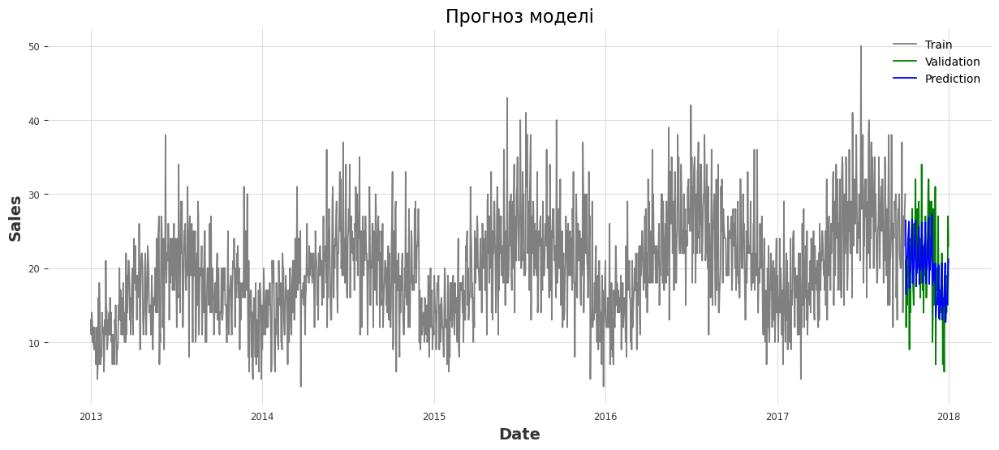

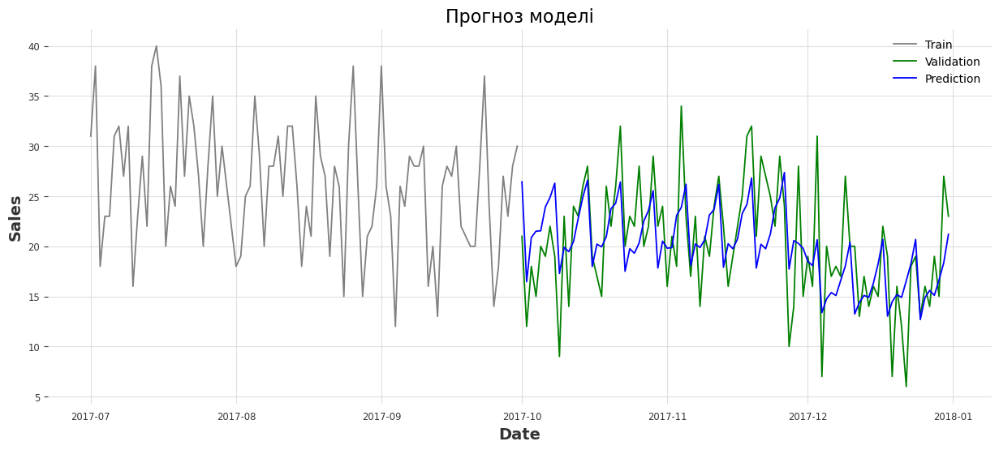

In [93]:
plot_results(series1, series2, forecast_xgb)

Шукаю кращі параметри за допомогою Hyperopt:

In [107]:
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from darts.metrics import mape

def objective(params):
    model = XGBModel(
        lags=7,  
        lags_future_covariates =[0],
        max_depth=int(params['max_depth']),
        learning_rate=params['learning_rate'],
        n_estimators=int(params['n_estimators']),
        min_child_weight=int(params['min_child_weight']),
        subsample=params['subsample'],
        colsample_bytree=params['colsample_bytree'],
        gamma=params['gamma'],
        reg_alpha=params['reg_alpha'],
        reg_lambda=params['reg_lambda'],
        random_state=42,
        verbosity=0
    )
    model.fit(
        series = train_scaled,
        future_covariates=TimeSeries.from_dataframe(train_exog_scaled),
        verbose=False
    )
    
    pred_scaled = model.predict(len(series2), future_covariates=TimeSeries.from_dataframe(test_exog_scaled))
    pred = scaler_series.inverse_transform(pred_scaled)
    error = mape(series2, pred)
    
    return {'loss': error, 'status': STATUS_OK}

space = {
    'max_depth': hp.quniform('max_depth', 2, 5, 1),
    'learning_rate': hp.loguniform('learning_rate', -5, 0),
    'n_estimators': hp.quniform('n_estimators', 50, 250, 10),
    'min_child_weight': hp.quniform('min_child_weight', 5, 12, 1),
    'subsample': hp.uniform('subsample', 0.5, 1.0),                
    'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),  
    'gamma': hp.uniform('gamma', 0, 5),                            
    'reg_alpha': hp.loguniform('reg_alpha', -5, 1),                
    'reg_lambda': hp.loguniform('reg_lambda', -5, 1)
}


trials = Trials()
best = fmin(objective, space, algo=tpe.suggest, max_evals=400, trials=trials)

# Перетворення значень гіперпараметрів у кінцеві типи
best['n_estimators'] = int(best['n_estimators'])
best['max_depth'] = int(best['max_depth'])
best['min_child_weight'] = int(best['min_child_weight'])

print("Найкращі гіперпараметри:", best)

model_xgb = XGBModel(
    lags=7,  
    lags_future_covariates =[0],
    n_estimators=best['n_estimators'],
    learning_rate=best['learning_rate'],
    max_depth=best['max_depth'],
    min_child_weight=best['min_child_weight'],
    subsample=best['subsample'],
    colsample_bytree=best['colsample_bytree'],
    gamma=best['gamma'],
    reg_alpha=best['reg_alpha'],
    reg_lambda=best['reg_lambda'],
    random_state=42
)

model_xgb.fit(series = train_scaled,
              future_covariates=TimeSeries.from_dataframe(train_exog_scaled),
              verbose=False)

forecast_scaled = model_xgb.predict(len(series2), future_covariates=TimeSeries.from_dataframe(test_exog_scaled))
forecast_xgb = scaler_series.inverse_transform(forecast_scaled)
eval_forecast(model_xgb, series2, forecast_xgb)

100%|██████████| 400/400 [00:32<00:00, 12.47trial/s, best loss: 21.449821253542613]
Найкращі гіперпараметри: {'colsample_bytree': 0.8157846581040961, 'gamma': 0.10323203094934906, 'learning_rate': 0.17919228690813757, 'max_depth': 3, 'min_child_weight': 8, 'n_estimators': 140, 'reg_alpha': 0.01192829143149317, 'reg_lambda': 0.008112622634491355, 'subsample': 0.5000698451124225}
model XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8157846581040961, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0.10323203094934906,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.17919228690813757,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             mi

21.449821253542613

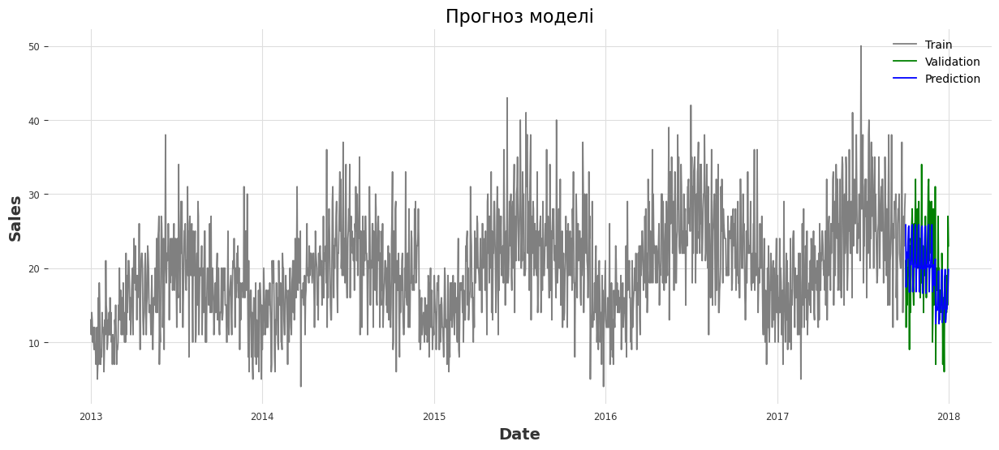

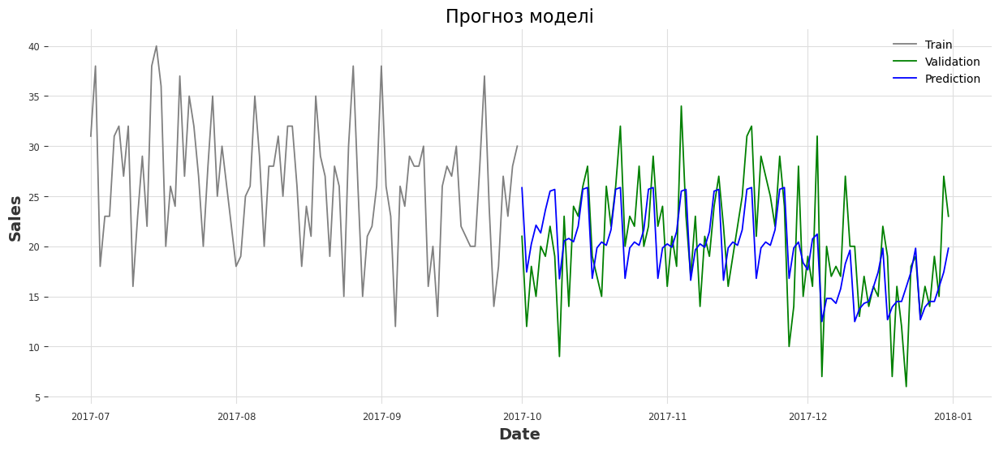

In [110]:
plot_results(series1, series2, forecast_xgb)

### ExponentialSmoothing
11. Натренуйте модель ExponentialSmoothing та зробіть висновок про її якість.

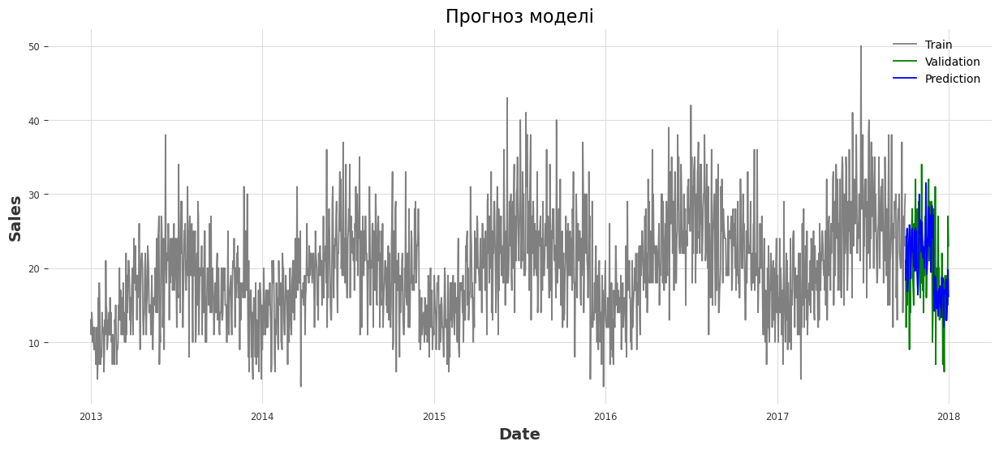

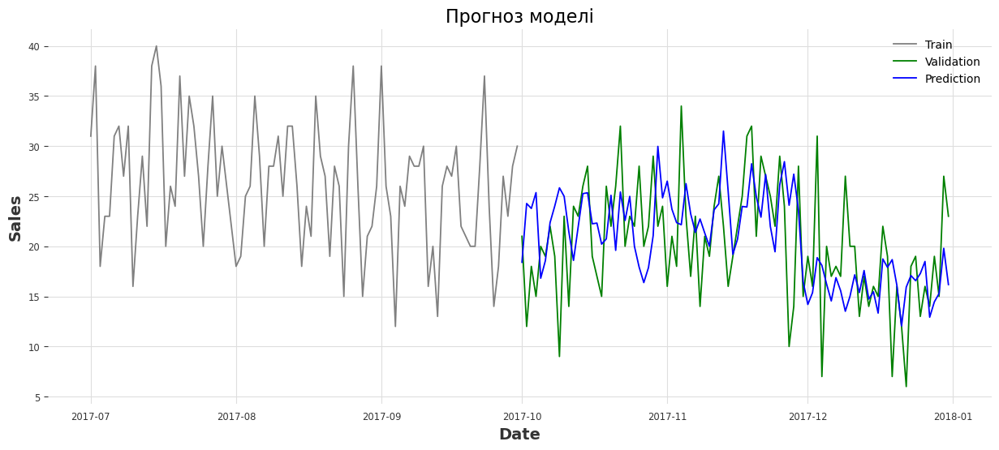

model ExponentialSmoothing(seasonal=SeasonalityMode.MULTIPLICATIVE, seasonal_periods=365) obtains MAPE: 28.01%


In [112]:
from darts.models import ExponentialSmoothing, ARIMA, AutoARIMA, Theta
from darts.utils.utils import SeasonalityMode

model_exp = ExponentialSmoothing(
    seasonal_periods=365,          
    seasonal=SeasonalityMode.MULTIPLICATIVE,         
    damped=False
)

fit_and_plot(model_exp, series, series1, series2)

Помилка моделі велика, з параметром seasonal=SeasonalityMode.MULTIPLICATIVE трохи краще але не суттєво.

### ARIMA
12. Натренуйте модель ARIMA, параметри оберіть самостійно.Зробіть висновок про її якість.

Для визначення параметру d моделі ARIMA проведу ADF-тест, використовуючи тренувальні дані:

In [115]:
from statsmodels.tsa.stattools import adfuller

In [117]:
# Виконання ADF тесту
result = adfuller(data_1_1.loc[data_1_1.index <= '2017-09-30', 'sales'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -2.936551
p-value: 0.041260
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568


Значення ADF статистики (-2.936551) є більшим лише за 1%-критичне значення, тому можна відхилити нульову гіпотезу, це означає що ряд стаціонарний.
Значення p-value (0.041260) є меншим за 0.05, тому ми відхиляємо нульову гіпотезу про нестабільність ряду.

Отже d = 0.

Як виявлено з аналізу PACF, параметр p оберу рівним 7. 
Для визначення q провела експерименти та обрала q = 2 з найменшими AIC та BIC:

In [121]:
import statsmodels.api as sm

# Строим ARIMA
model = sm.tsa.ARIMA(series1.to_series(), order=(7, 0, 2))
fit = model.fit()

print(f"AIC: {fit.aic:.2f}")
print(f"BIC: {fit.bic:.2f}")

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



AIC: 10621.15
BIC: 10681.19


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



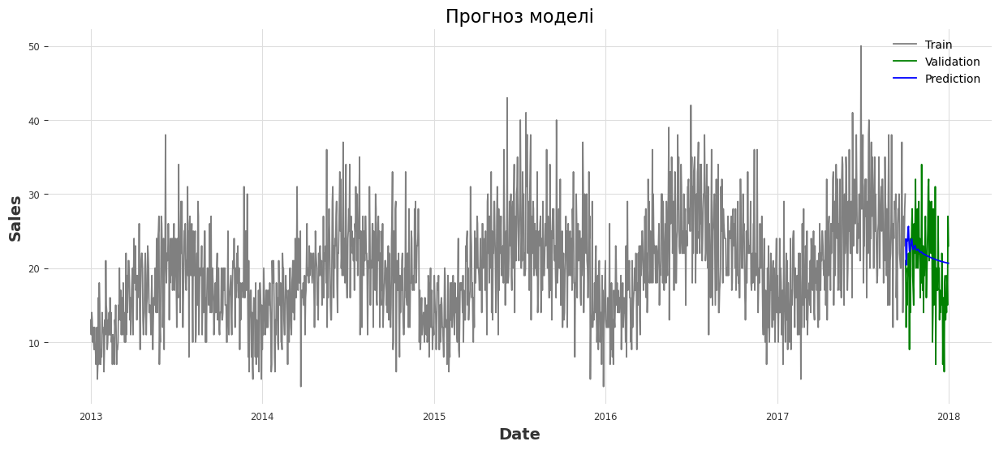

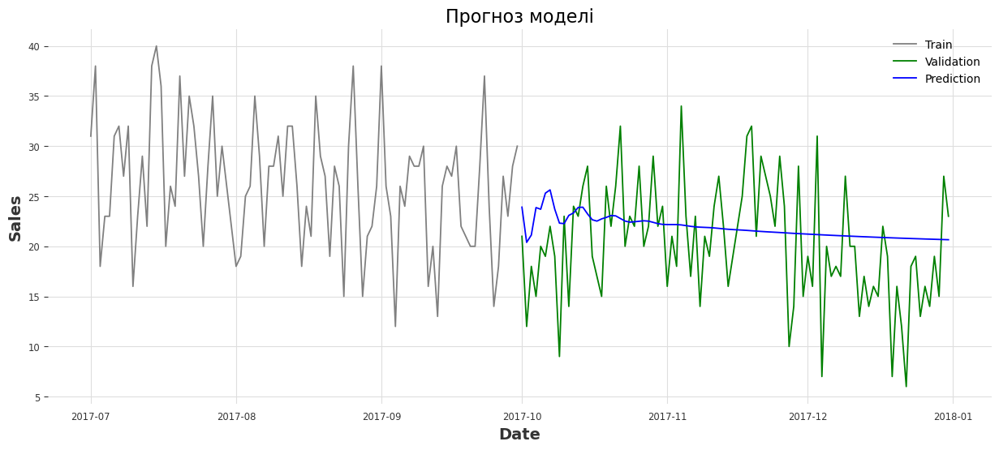

model ARIMA(p=7, d=0, q=2) obtains MAPE: 30.90%


In [123]:
from darts.models import ARIMA

model_arima = ARIMA(p=7, d=0, q=2)

fit_and_plot(model_arima,series,series1,series2)

Ця модель має велику помилку та візуально прогноз майже пряма лінія, не враховує сезонність.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



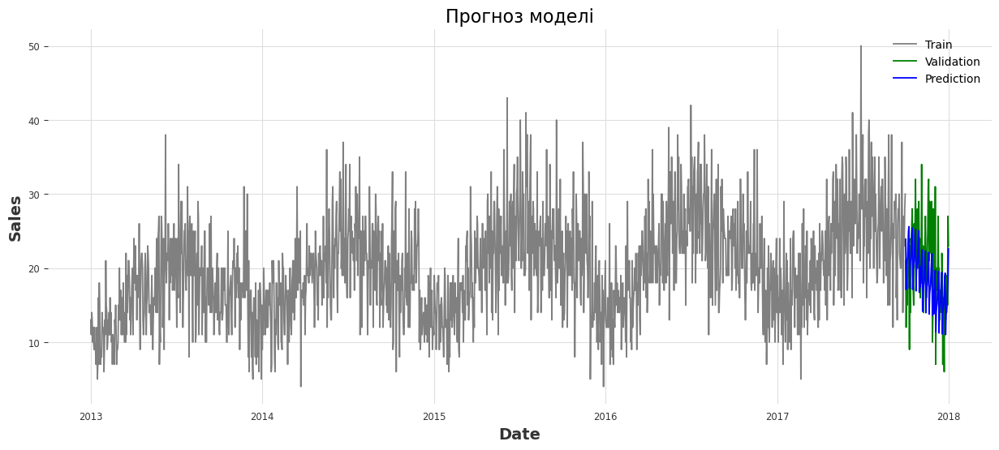

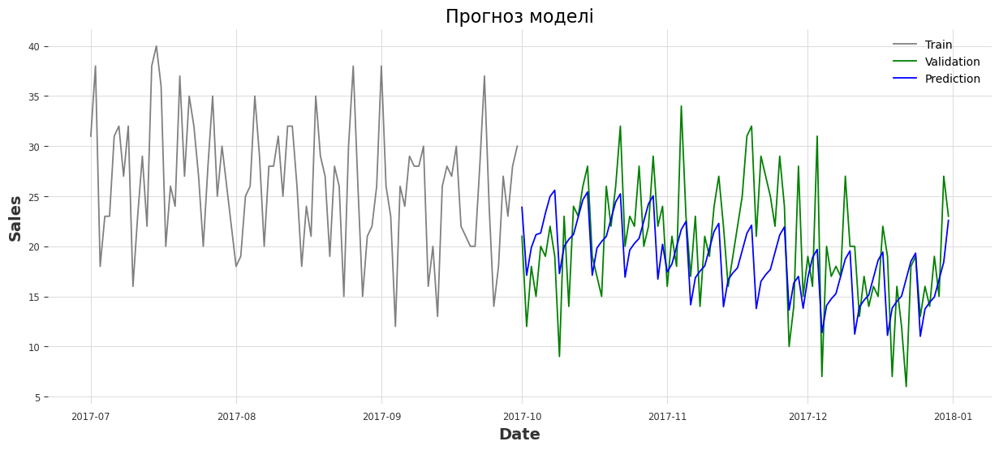

model ARIMA(p=1, q=2, seasonal_order=(1, 1, 1, 7)) obtains MAPE: 22.13%


22.130294461429276

In [124]:
series_pd = series.to_dataframe(copy=False)  
y = series_pd.iloc[:, 0].astype(float)

# Eкзогенні змінні
exog = enrich_with_date_features(series)

# Поділ на тренувальні та тестові дані
train, test = series.split_before(pd.Timestamp('2017-10-01'))
train_exog, test_exog = exog.split_before(pd.Timestamp('2017-10-01'))

# Створення моделі SARIMAX з урахуванням сезонності
model_sarimax = ARIMA(p=1, d=1, q=2, seasonal_order=(1, 1, 1, 7))
model_sarimax.fit(train, future_covariates=train_exog)

# Прогноз на test
forecast_sarimax = model_sarimax.predict(len(test), future_covariates=exog)

# Візуалізація результатів
plot_results(series1, series2, forecast_sarimax)
eval_forecast(model_sarimax, series2, forecast_sarimax)

Модель SARIMAX значно краще прогнозує та має менший MAPE.

### AutoARIMA
13. Знайдіть оптимальні параметри моделі ARIMA з допомогою AutoARIMA моделі. Виконайте пошук параметрів, виведіть, які паарметри виявились оптимальними і обчисліть якість моделі. Чи поліпшилась якість порівняно з попереднім експериментом?

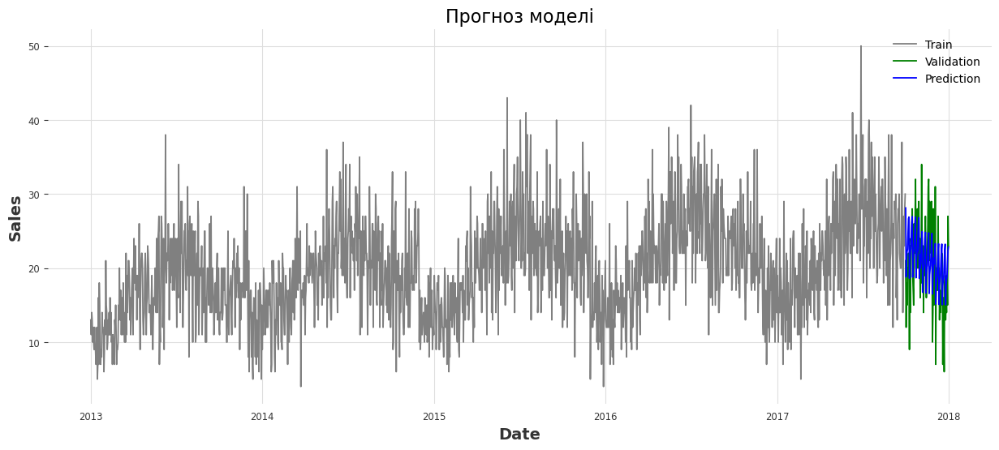

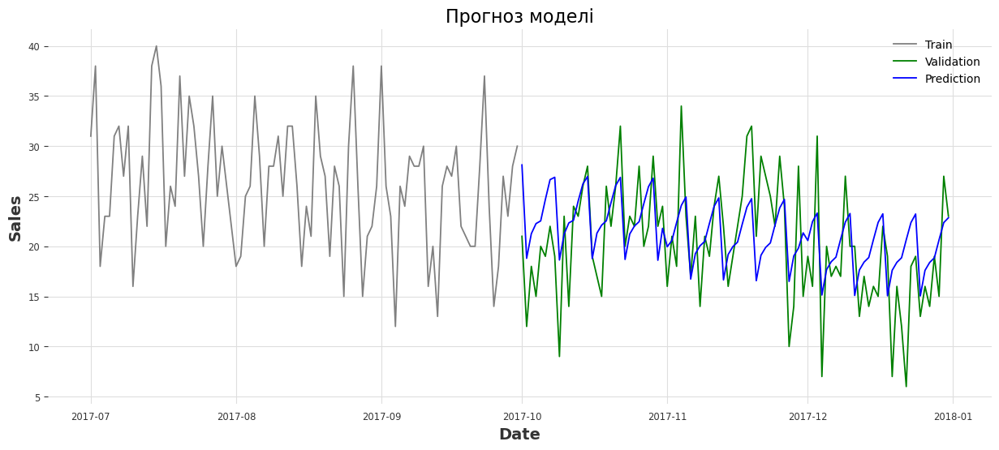

model AutoARIMA(seasonal=True, season_length=7, start_p=1, start_q=1, start_P=1, start_Q=1, max_p=5, max_q=5, max_d=2, max_P=2, max_Q=2, max_D=1, stepwise=True) obtains MAPE: 25.70%


25.697060692062315

In [127]:
# Побудова та тренування моделі AutoArima
model_autoarima = AutoARIMA(
    seasonal=True,
    season_length=7,
    start_p = 1,
    start_q = 1, 
    start_P = 1,
    start_Q = 1,
    max_p = 5,
    max_q = 5,
    max_d = 2,
    max_P = 2,
    max_Q = 2,
    max_D = 1,
    stepwise=True
)

model_autoarima.fit(train, future_covariates=train_exog)

# Прогноз на test
forecast_autarima = model_autoarima.predict(len(test), future_covariates=exog)

# Візуалізація результатів
plot_results(series1, series2, forecast_autarima)
eval_forecast(model_autoarima, series2, forecast_autarima)

#model_autoarima.model.summary()  - викликає помилку: 'AutoARIMA' object has no attribute 'summary'

Без екзогенів результат був MAPE: 40.56%.

Вручну знайдені параметри дали кращий результат.

Спробую модель Theta:

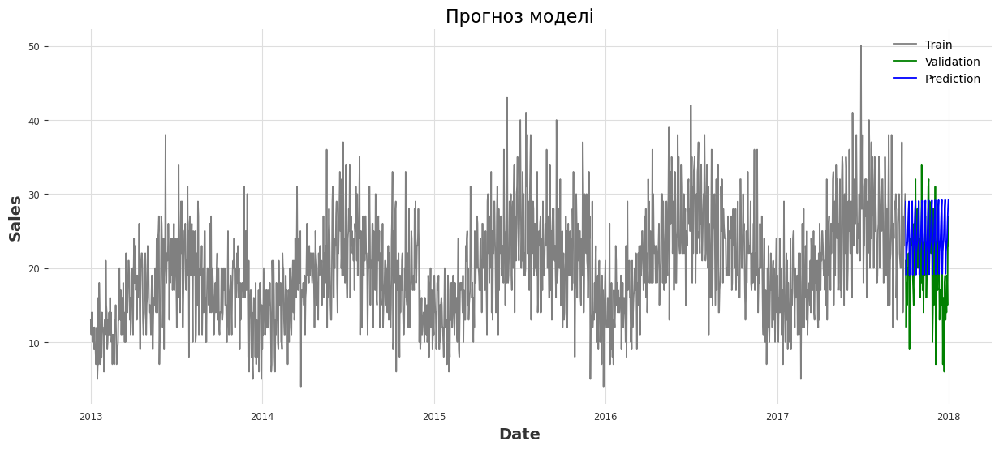

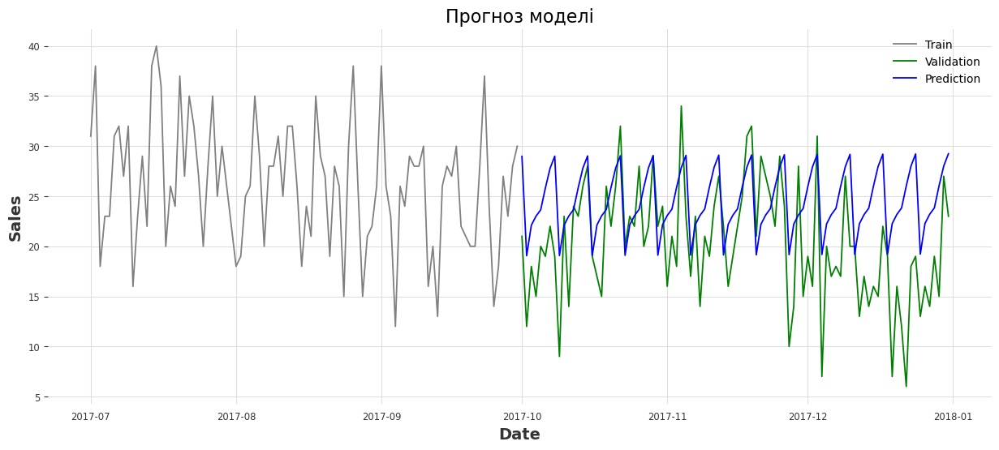

model Theta() obtains MAPE: 36.87%


36.87191925233642

In [129]:
from darts.models import Theta

model_theta = Theta()

model_theta.fit(train)

forecast_theta = model_theta.predict(len(test))

# Візуалізація результатів
plot_results(series1, series2, forecast_theta)
eval_forecast(model_theta, series2, forecast_theta)

In [131]:
# Пошук параметра theta:
best_mape = float('inf')
best_theta = None

for t in np.arange(-5.0, 5.1, 0.1):
    model = Theta(theta=t)
    model.fit(train)
    pred = model.predict(len(test))
    mape_val = mape(test, pred)
    if mape_val < best_mape:
        best_mape = mape_val
        best_theta = t

In [134]:
print(f"Best theta: {best_theta}, MAPE: {best_mape}")

Best theta: 0.09999999999998188, MAPE: 28.065681239673044


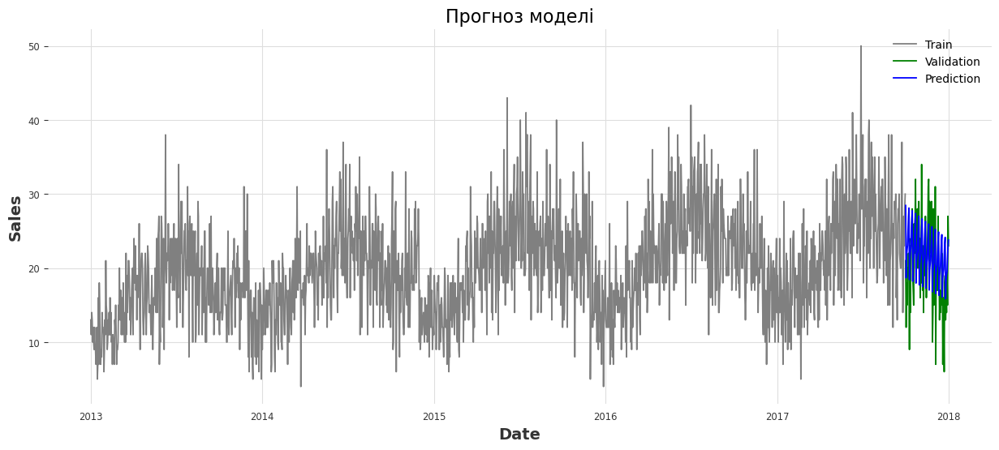

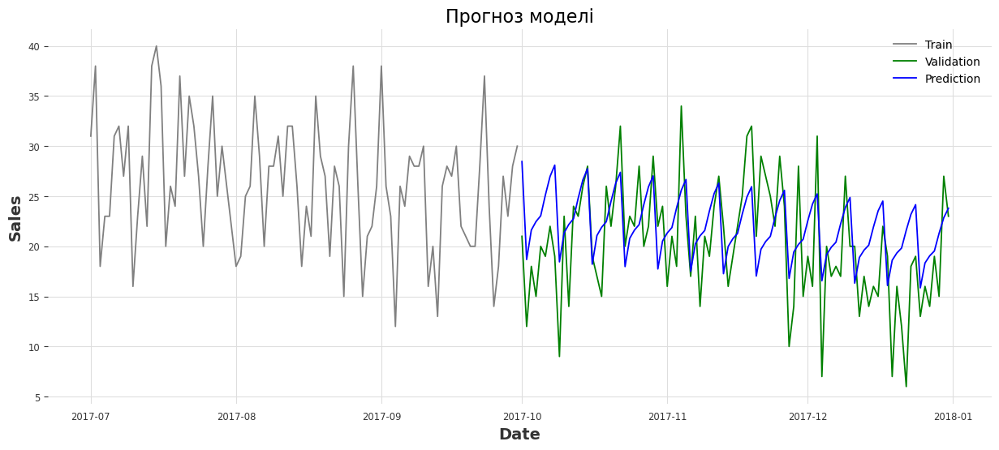

model Theta(theta=0.0999) obtains MAPE: 28.06%


28.057503706709262

In [136]:
model_theta = Theta(theta = 0.0999)

model_theta.fit(train)

forecast_theta = model_theta.predict(len(test))

# Візуалізація результатів
plot_results(series1, series2, forecast_theta)
eval_forecast(model_theta, series2, forecast_theta)

### Prophet
14. Натренуйте модель Prophet та зробіть висновок про її якість.

In [156]:
from darts.models import Prophet

# Налаштування моделі з параметрами
model_prophet = Prophet(
    yearly_seasonality=True,   # річна сезонность
    weekly_seasonality=True,   # тижнева
    daily_seasonality=False,   # без поденної сезонності
    seasonality_mode='multiplicative',  # мультиплікативна
    changepoint_prior_scale=0.05   # чутливість до точок зміни тренду
)

model_prophet.fit(series1, future_covariates=TimeSeries.from_dataframe(train_exog_scaled))

forecast_prophet = model_prophet.predict(len(series2), future_covariates=TimeSeries.from_dataframe(test_exog_scaled))

print(f"MAPE = {mape(series2, forecast_prophet):.2f}%")

22:30:56 - cmdstanpy - INFO - Chain [1] start processing
22:30:56 - cmdstanpy - INFO - Chain [1] done processing


MAPE = 21.80%


In [158]:
# Шукаю оптимальні параметри changepoint_prior_scale та seasonality_prior_scale
best_mape = float('inf')
best_params = None

for cps in np.linspace(0.001, 0.3, 20):
    for sps in np.linspace(0.01, 5, 20):
            model_prophet = Prophet(yearly_seasonality=True,
                                    weekly_seasonality=True,  
                                    daily_seasonality=False,   
                                    seasonality_mode='multiplicative',
                                    changepoint_prior_scale=cps,
                                    seasonality_prior_scale=sps)
            model_prophet.fit(series1, future_covariates=TimeSeries.from_dataframe(train_exog_scaled))
            forecast = model_prophet.predict(len(series2),future_covariates=TimeSeries.from_dataframe(test_exog_scaled))
            mape_score = mape(series2, forecast)
            if mape_score < best_mape:
                best_mape = mape_score
                best_params = [cps, sps]

In [160]:
print(best_params, mape_score)

[0.3, 2.1110526315789473] 21.676604707444277


22:33:20 - cmdstanpy - INFO - Chain [1] start processing
22:33:20 - cmdstanpy - INFO - Chain [1] done processing


model Theta(theta=4.9999999999999645) obtains MAPE: 21.67%
MAPE for Prophet model = 21.67%


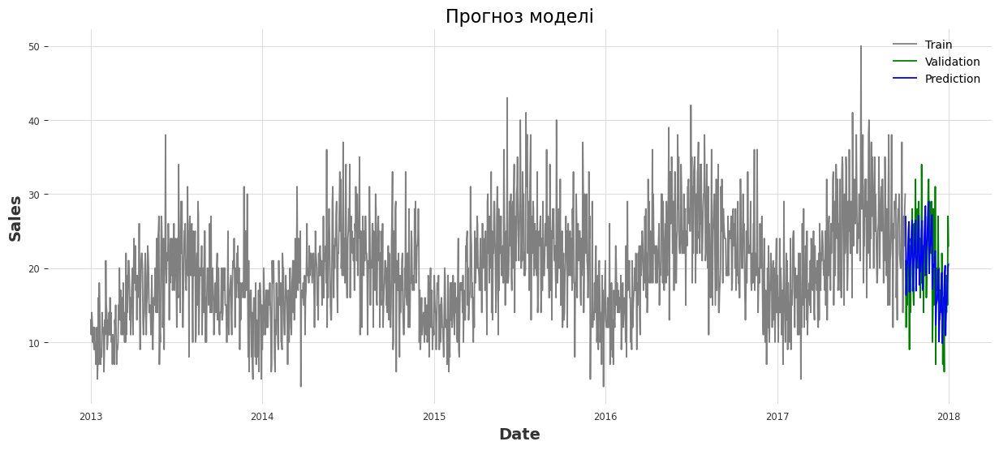

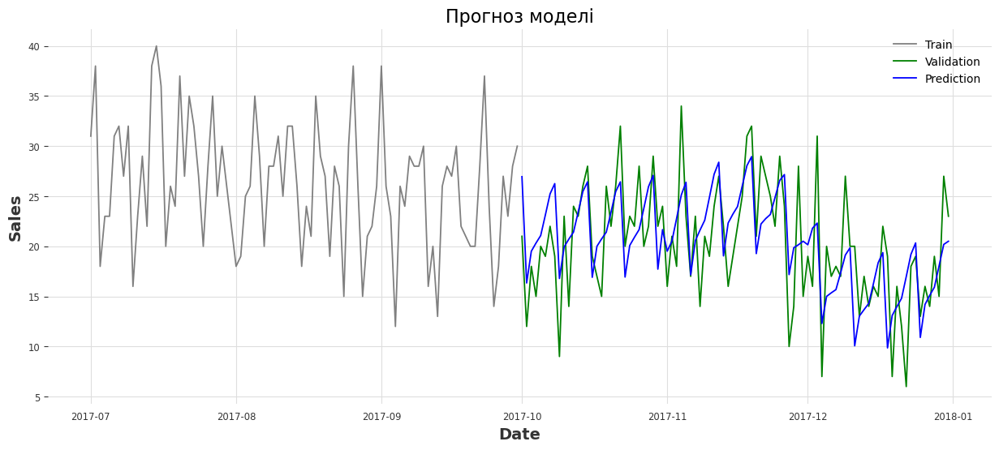

In [162]:
# Налаштування моделі зі знайденими параметрами
model_prophet = Prophet(
    yearly_seasonality=True,   
    weekly_seasonality=True,   
    daily_seasonality=False,   
    seasonality_mode='multiplicative',  
    changepoint_prior_scale = 0.3,
    seasonality_prior_scale = 2.111
)

model_prophet.fit(series1, future_covariates=TimeSeries.from_dataframe(train_exog_scaled))

forecast_prophet = model_prophet.predict(len(series2), future_covariates=TimeSeries.from_dataframe(test_exog_scaled))

print(f"MAPE for Prophet model = {eval_forecast(model, series2, forecast_prophet):.2f}%")

plot_results(series1, series2, forecast_prophet)

Модель показала відносно непоганий результат.

### RNNModel
15. Натренуйте модель `RNNModel` та зробіть висновок про її якість.

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.8 K  | train
6 | V               | Linear           | 26     | train
-------------------------------------------------------------
2.8 K     Trainable params
0         Non-trainable params
2.8 K     Total params
0.011     Total estimated model params size (MB)
7         Modules in train mode
0         Modules in eval mode
/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:683: UserWarning:

'pin_memory' argument is 

Training: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=300` reached.
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

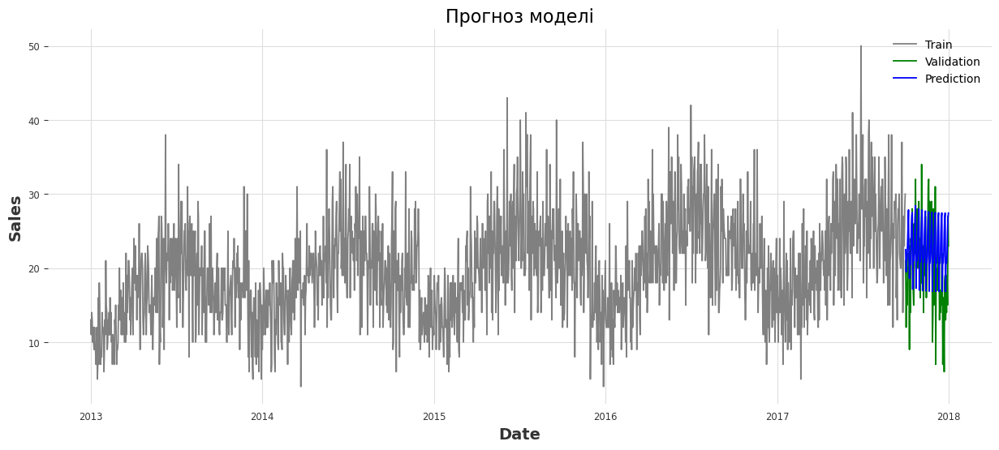

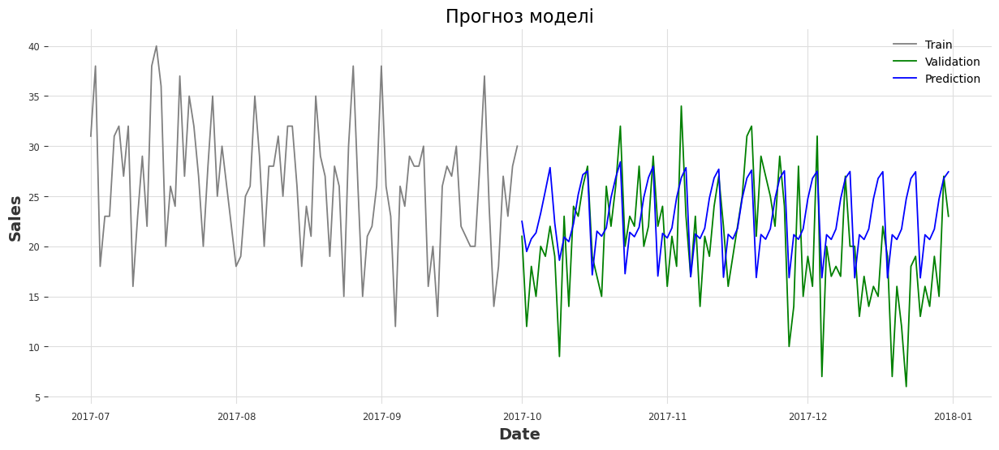

In [167]:
from darts.models import RNNModel

# Масштабування даних
scaler = Scaler()
train_scaled = scaler.fit_transform(train)
test_scaled = scaler.transform(test)
series_scaled = scaler.transform(series)

# Без цього не працює
train = train.astype(np.float32)
test = test.astype(np.float32)
train_scaled = train_scaled.astype(np.float32)
test_scaled = test_scaled.astype(np.float32)
series_scaled = series_scaled.astype(np.float32)
train_exog_scaled = train_exog_scaled.astype(np.float32)
test_exog_scaled = test_exog_scaled.astype(np.float32)

# Побудова та тренування моделі LSTM
model_lstm = RNNModel(model='LSTM', input_chunk_length=7, n_epochs=300)
model_lstm.fit(train)

# Прогнозування
forecast_lstm = model_lstm.predict(len(test))

# Візуалізація результатів
plot_results(series1, series2, forecast_lstm)

In [169]:
eval_forecast(model_lstm, series2, forecast_lstm)

model RNNModel(model=LSTM, input_chunk_length=7, n_epochs=300) obtains MAPE: 31.66%


31.66382270588355

З базовими параметрами якість моделі дуже погана (MAPE = 31.66%). 
Тут виникли труднощі з підбором параметрів - застосовувала Hyperopt аналогічно як з моделлю XGB, але було дуже довго та не ефективно (MAPE більше 30%). Можливо недовчила, а можливо треба іншим способом шукати? Як це робиться на практиці?

Параметри підібрала вручну.

In [196]:
from darts.models import RNNModel

# Побудова та тренування моделі LSTM
model_lstm = RNNModel(
    model="LSTM",
    input_chunk_length=7,  
    training_length=62,
    hidden_dim=128,
    n_rnn_layers=2,
    dropout=0.05,
    batch_size=50,
    n_epochs=250,
    random_state=42,
    optimizer_kwargs={"lr": 1e-3}
)

model_lstm.fit(
    series=train_scaled,
    future_covariates= TimeSeries.from_dataframe(train_exog_scaled).astype(np.float32),
    val_series=test_scaled,
    val_future_covariates=TimeSeries.from_dataframe(test_exog_scaled).astype(np.float32)
)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:683: UserWarning:

'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

RNNModel(model=LSTM, hidden_dim=128, n_rnn_layers=2, dropout=0.05, training_length=62, input_chunk_length=7, batch_size=50, n_epochs=250, random_state=42, optimizer_kwargs={'lr': 0.001})

/opt/anaconda3/lib/python3.12/site-packages/torch/utils/data/dataloader.py:683: UserWarning:

'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.



Predicting: |          | 0/? [00:00<?, ?it/s]

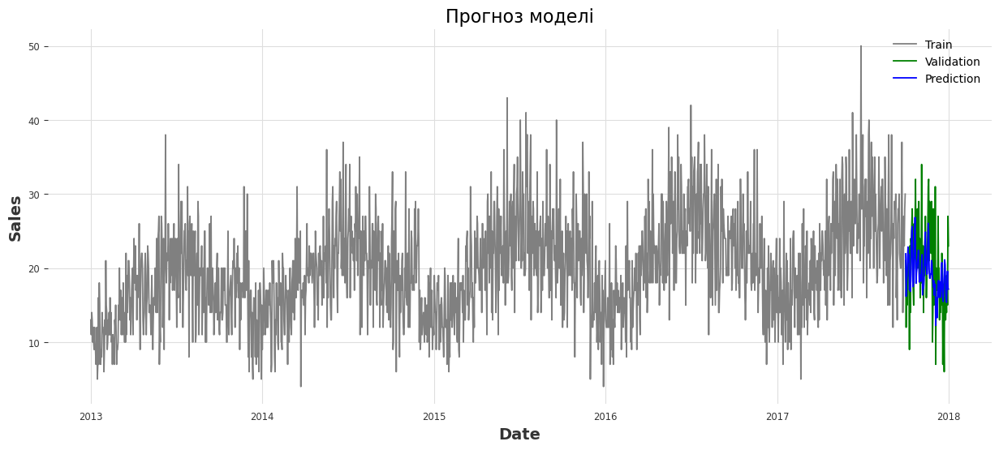

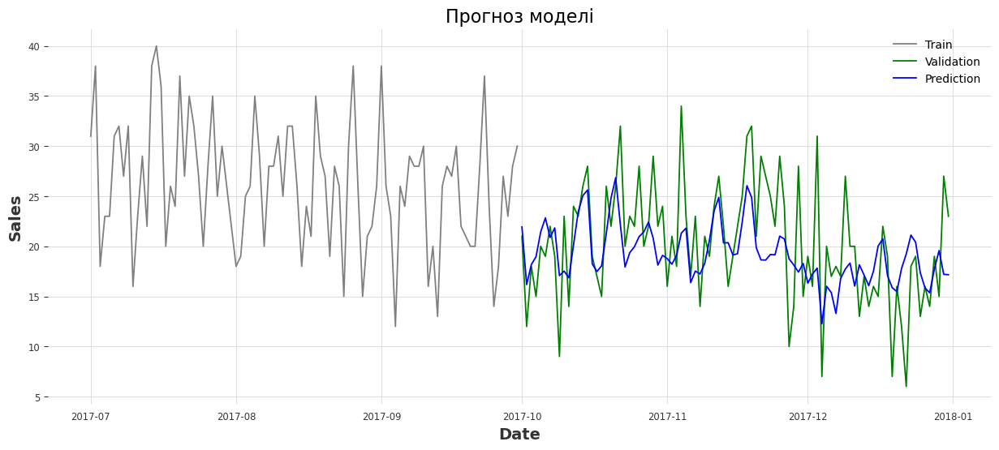

model RNNModel(model=LSTM, hidden_dim=128, n_rnn_layers=2, dropout=0.05, training_length=62, input_chunk_length=7, batch_size=50, n_epochs=250, random_state=42, optimizer_kwargs={'lr': 0.001}) obtains MAPE: 22.06%
MAPE for LSTM model = 22.06%


In [204]:
exog_scaled = TimeSeries.from_dataframe(pd.concat([train_exog_scaled, test_exog_scaled]))

forecast_lstm_scaled = model_lstm.predict(len(test_scaled), 
                                future_covariates = exog_scaled)

forecast_lstm = scaler.inverse_transform(forecast_lstm_scaled)

plot_results(series1, series2, forecast_lstm)
print(f"MAPE for LSTM model = {eval_forecast(model_lstm, series2, forecast_lstm):.2f}%")

Візуально прогноз цікавіший за інші моделі, складніший, паттерни не очевидні. 

### Бектест
16. Виконайте бектест для тої моделі, яка виявилась найкращою у вашому дослідженні на періоді 1 рік з передбаченнями на 1 місяць щоразу. Візуалізуйте як поводилась модель протягом бектесту, яка була точність?

In [210]:
# Результати
drift_seasonal_mape  = mape(series2, combined_forecast)
xgb_mape = mape(series2, forecast_xgb)
exp_mape = mape(series2, model_exp.predict(len(series2)))
arima_mape = mape(series2, model_arima.predict(len(series2)))
sarimax_mape = mape(series2, forecast_sarimax)
autoarima_mape = mape(series2, forecast_autarima)
prophet_mape = mape(series2, forecast_prophet)
lstm_mape = mape(series2, forecast_lstm)

results_table = pd.DataFrame({
    'Drift + Seasonal': [drift_seasonal_mape],
    'XGB': [xgb_mape],
    'Exponential Smoothing': [exp_mape],
    'ARIMA': [arima_mape],
    'SARIMAX': [sarimax_mape],
    'AutoARIMA': [autoarima_mape],
    'Prophet': [prophet_mape],
    'LSTM': [lstm_mape]
}).T 

results_table.columns = ['MAPE']

results_table = results_table.sort_values('MAPE')

print(results_table)

                            MAPE
XGB                    21.449821
Prophet                21.669113
LSTM                   22.056085
SARIMAX                22.130294
AutoARIMA              25.697061
Exponential Smoothing  28.009126
ARIMA                  30.896519
Drift + Seasonal       39.906290


Найкращий результат у моделі XGB, але цікаво подивитися на модель Prophet, бо щось нове:)

In [294]:
historical_fcast_all = model_prophet.historical_forecasts(
    series,
    start=len(series) - 365,
    forecast_horizon=30,
    stride=30,          
    last_points_only=False,
    verbose=True
)

historical forecasts:   0%|          | 0/12 [00:00<?, ?it/s]

MAPE = 20.14%


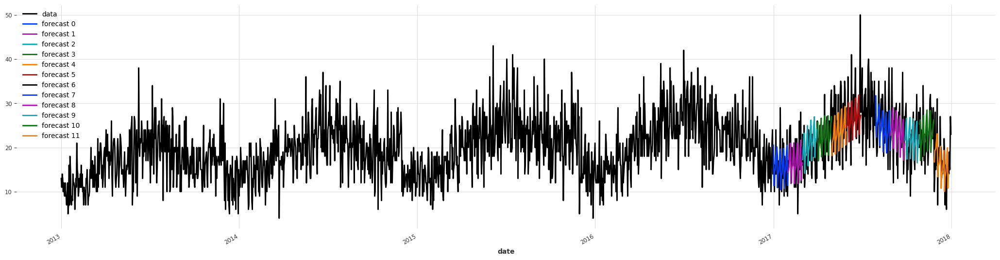

In [295]:
plt.figure(figsize=(26, 6))
series.plot(label="data")
for idx, hfc in enumerate(historical_fcast_all):
    hfc.plot(label=f"forecast {idx}")

from darts import concatenate
historical_fcast_all = concatenate(historical_fcast_all, axis=0)
print(f"MAPE = {mape(series, historical_fcast_all):.2f}%")

Точність моделі залишається стабільною👌

Всю варіантивність не вгадали, але виглядає непогано!

### all items
17. На цьому етапі ви зрозуміли, як моделювати продажі одного айтему з 1 магазину. Як би ви підійшли до задачі прогнозування продажів в наступному місяці для кожного з 50 айтемів в кожному з 10 магазинів? Опишіть загальний підхід
- яку модель ви б використали
- скільки моделей ви б тренували
- обгрунтуйте свій вибір.

Я би використала модель XGB оскільки вона дала найкращий результат. Погрупувала б дані та навчила 10*50 моделей, на вже знайдених параметрах. Далі необхідно оцінити MAPE для кожної моделі окремо щоб побачити чи немає проблем з якимсь рядом і потім подивитись загальний MAPE.